# Trabajo Práctico Final
<br/>

## Curso de Especialización en Inteligencia Artificial
## Inteligencia Artificial para Robótica
<br/>

### Autor: Maximiliano Torti
### Fecha: 12/01/2021
<br/>

# Descripción del trabajo

Se desea realizar el seguimiento y predicción de movimiento de un objeto en un determinado espacio finito, empleando dispositivos IoT de bajo consumo. Normalmente, esto se resuelve con la utilización de módulos GPS; sin embargo estos módulos son costosos (alrededor de unos U$S 20) y poseen consumos elevados (del orden de los cientos de mA). A la vez, no pueden ser utilizados en interiores.

Como alternativa se propone reemplazar el módulo GPS por módulos de menor consumo (del orden de los 10 uA a 100 uA) y costo (entre U$S 1 y U$S 3) como acelerómetros, giróscopos, magnetómetros, etc. 

Como prueba de concepto, se realizaron dos rutas en auto por la ciudad de rosario y se utilizó un celular para hacer datalogging de los sensores junto con la información del GPS. Se probará si es posible realizar el seguimiento del vehículo sin utilizar la latitud y longitud del GPS. En un principio, el problema tendrá hipótesis que lo harán relativamente simple y luego se agregará complejidad en los siguientes puntos.

In [119]:
import pandas as pd
import numpy as np
from scipy import stats
import math
import datetime
import cv2 as cv
import pickle as pkl
import copy

%config InlineBackend.print_figure_kwargs={'facecolor' : "w"}
from matplotlib import pyplot as plt
plt.rcParams['figure.figsize'] = (20, 9)
plt.rcParams['font.family'] = 'DejaVu Sans'
plt.rcParams['font.size'] = 20
plt.rcParams["axes.grid"] =True

from sklearn.linear_model import LinearRegression

import tensorflow as tf

# Utilidades previas

## Mapa

Para poder trabajar y observar los resultados, se necesitará constantemente realizar representaciones en el mapa y utilizar funciones de geo-localizacion. Estas necesidades se resumen en la clase mapa.

In [3]:
class my_map:
    
    color_map = None
    policy = None
    pos_to_coord = None
    coord_to_pos = None
    
    def __init__(self, path_to_map, path_to_policy=None):
        self.color_map = cv.imread(path_to_map)
        self.color_map = cv.cvtColor(self.color_map, cv.COLOR_BGR2RGB)
        if path_to_policy is None:
            self.policy = np.ones(shape=self.map.shape())*255
        else:
            self.policy = cv.imread(path_to_policy,cv.IMREAD_GRAYSCALE)
        
        pass
    
    
    def calibrate(self, calib_coord, calib_bmp):
        self.coord_to_pos = LinearRegression()
        self.coord_to_pos.fit(calib_coord,calib_bmp)
        self.pos_to_coord = LinearRegression()
        self.pos_to_coord.fit(calib_bmp,calib_coord)
    
    
    def to_coord(self, bmp_pos):
        if self.pos_to_coord is not None:
            return self.pos_to_coord.predict(bmp_pos)
        else:
            return None
    
    
    def to_pos(self, coord):
        if self.coord_to_pos is not None:
            return np.round(self.coord_to_pos.predict(coord)).astype(int)
        else:
            return None
    
    
    def plot(self, coord, file=None):
        pos = self.to_pos(coord)
        fig = plt.figure(figsize=(40,20))
        plt.grid(False)
        plt.imshow(self.color_map)
        if pos is not None:
            for point in pos:
                plt.scatter(point[1], point[0], c='red', s=15)
        plt.show()
        if file is not None:
            fig.savefig(file, bbox_inches='tight')
        
    
    def plot_policy(self):
        plt.figure(figsize=(40,20))
        plt.grid(False)
        plt.imshow(self.policy)
        plt.show()
        
    
    def get_policy_prob (self,coords):
        points = self.to_pos(coords)
        prob = np.zeros(points.shape[0])
        for i,point in enumerate(points):
            if ((point[0]<0) or (point[0]>=self.policy.shape[0]) or (point[1]<0) or (point[1]>=self.policy.shape[1])):
                prob[i] = self.policy[0,0] * 0
            else:
                prob[i] = self.policy[point[0],point[1]] / 255
        
        return prob
    
    @staticmethod
    def destinationPoint(lat, lon, distance, bearing):
        '''
        Returns the destination point from a given point, having travelled the given distance
        on the given initial bearing.

        @param   {number} lat - initial latitude in decimal degrees (eg. 50.123)
        @param   {number} lon - initial longitude in decimal degrees (e.g. -4.321)
        @param   {number} distance - Distance travelled (metres).
        @param   {number} bearing - Initial bearing (in degrees from north).
        @returns {array} destination point as [latitude,longitude] (e.g. [50.123, -4.321])

        @example
        var p = destinationPoint(51.4778, -0.0015, 7794, 300.7); // 51.5135°N, 000.0983°W
        '''
        radius = 6371e3; # (Mean) radius of earth
        
        def toRadians(v):
            return v * math.pi / 180
        
        def toDegrees(v):
            return v * 180 / math.pi


        delta = distance / radius; # angular distance in radians
        theta = toRadians(bearing);

        phi_1 = toRadians(lat);
        lambda_1 = toRadians(lon);
        
        sin_phi_1 = math.sin(phi_1) 
        cos_phi_1 = math.cos(phi_1)
        sin_delta = math.sin(delta)
        cos_delta = math.cos(delta)
        sin_theta = math.sin(theta)
        cos_theta = math.cos(theta)

        sin_phi_2 = sin_phi_1* cos_delta + cos_phi_1 * sin_delta * cos_theta
        phi_2 = math.asin(sin_phi_2)
        y = sin_theta * sin_delta * cos_phi_1
        x = cos_delta - sin_phi_1 * sin_phi_2
        lambda_2 = lambda_1 + math.atan2(y, x)
        
        lat2 = toDegrees(phi_2)
        
        lon2 = (toDegrees(lambda_2) + 540) % 360 - 180 # normalise to −180..+180°

        return lat2,lon2
    
    @staticmethod
    def haversine(lon1, lat1, lon2, lat2):
        """
        Calculate the great circle distance in meters between two points 
        on the earth (specified in decimal degrees)
        """
        # convert decimal degrees to radians 
        lon1 = math.radians (lon1)
        lat1 = math.radians (lat1)
        lon2 =  math.radians (lon2)
        lat2 =  math.radians (lat2)

        # haversine formula 
        dlon = lon2 - lon1 
        dlat = lat2 - lat1 
        a = math.sin(dlat/2)**2 + math.cos(lat1) * math.cos(lat2) * math.sin(dlon/2)**2
        c = 2 * math.asin(math.sqrt(a)) 
        r = 6371 * 1000 # Radius of earth in meters.
        return c * r 

**Test de la clase y sus utilidades**

In [4]:
rosario_map_path = 'map/raw.png'
rosario_policy_path = 'map/Rosario_compress_blur.bmp'

work_map = my_map(rosario_map_path,rosario_policy_path)

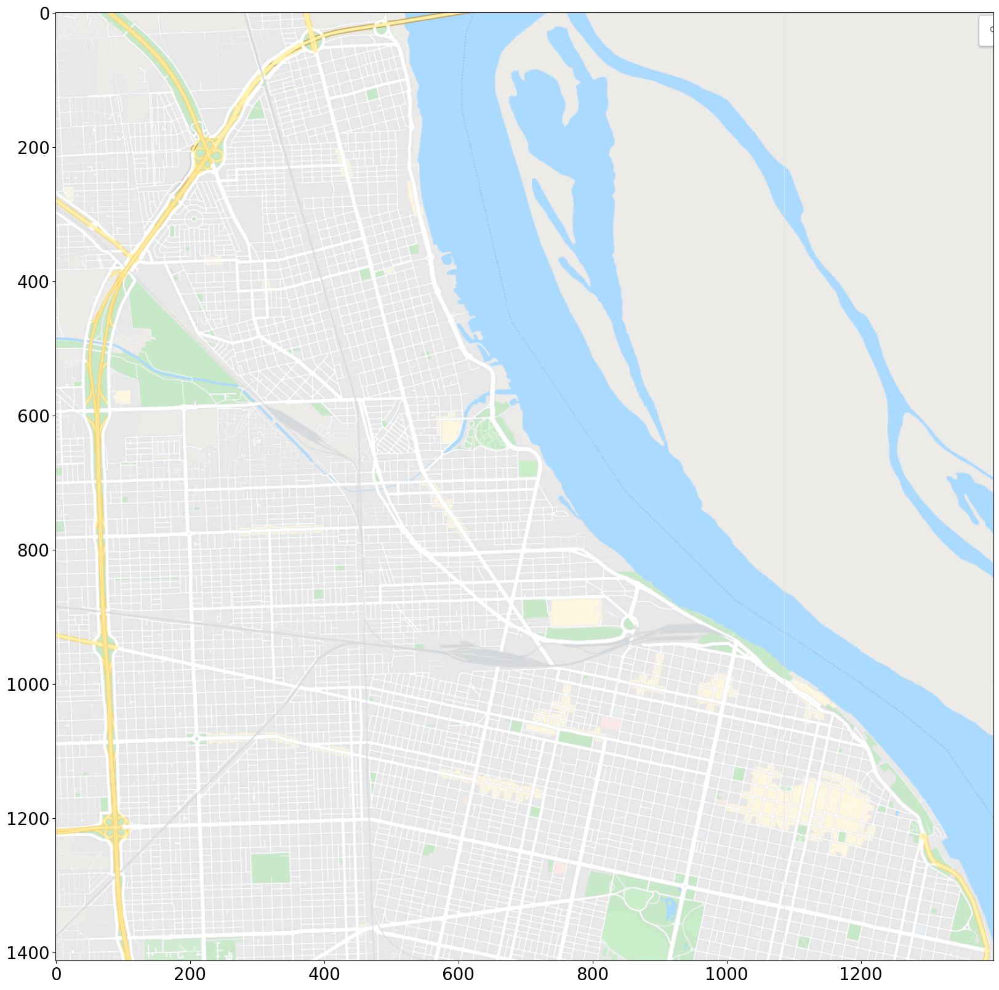

In [5]:
work_map.plot(None)

**En la clase mapa también se agrega una máscara (bmp en escala de grises) que se utilizará para conocer las posiciones por las cuales un vehículo puede con cierta probabilidad circular**

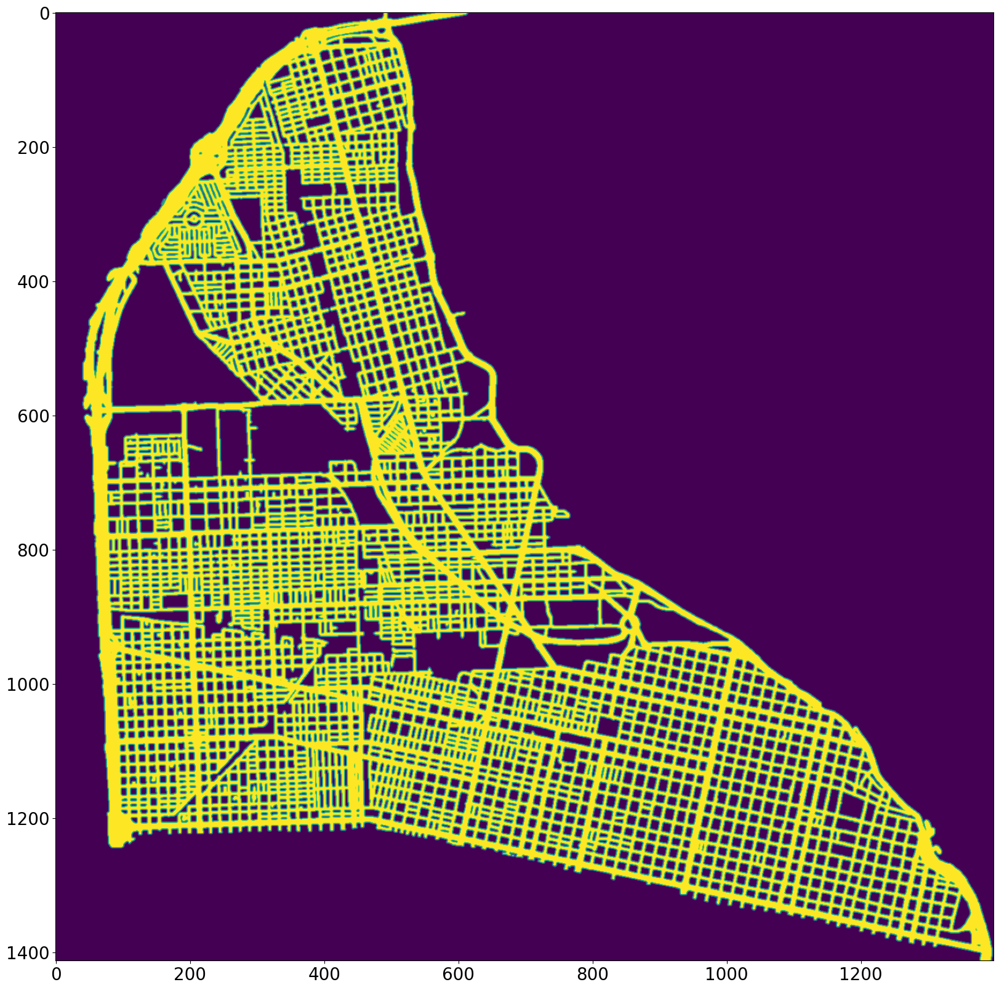

In [7]:
work_map.plot_policy()

**Para poder pasar de coordenadas de geolocalización a coordenadas x,y del mapa (y viceversa), es necesario realizar una calibración. Esta calibración se realiza tomando puntos de referencia en el mapa y en la imágen y entrenando un modelo simple de regresión lineal que haga la transformación en forma automática** 

In [9]:
# Puntos de calibración Mapa - BMP
# 1: Alem y Pellegrini
# 2: Pellegrini y Provincias unidas
# 3: Rondeau y Pintor Musto
# 4: Francia y Luis Candido Carballo
calib_coord = [ #[ Latitude , Longitude ]
                [ -32.95907 , -60.63112],
                [ -32.9486 , -60.71226],
                [ -32.87341 , -60.69889],
                [ -32.92526 , -60.66143]
              ]

calib_bmp = [   #[height, width]
                [ 1370 , 1258],
                [ 1212 , 215],
                [ 56, 386],
                [ 853, 867]
            ]

In [10]:
work_map.calibrate(calib_coord,calib_bmp)

**Testeo de la calibración**

In [11]:
# Test con datos de entrenamiento
print(work_map.to_pos([[ -32.87341 , -60.69889]]))
print(work_map.to_coord([[56,386]]))

[[ 56 386]]
[[-32.87338416 -60.69886842]]


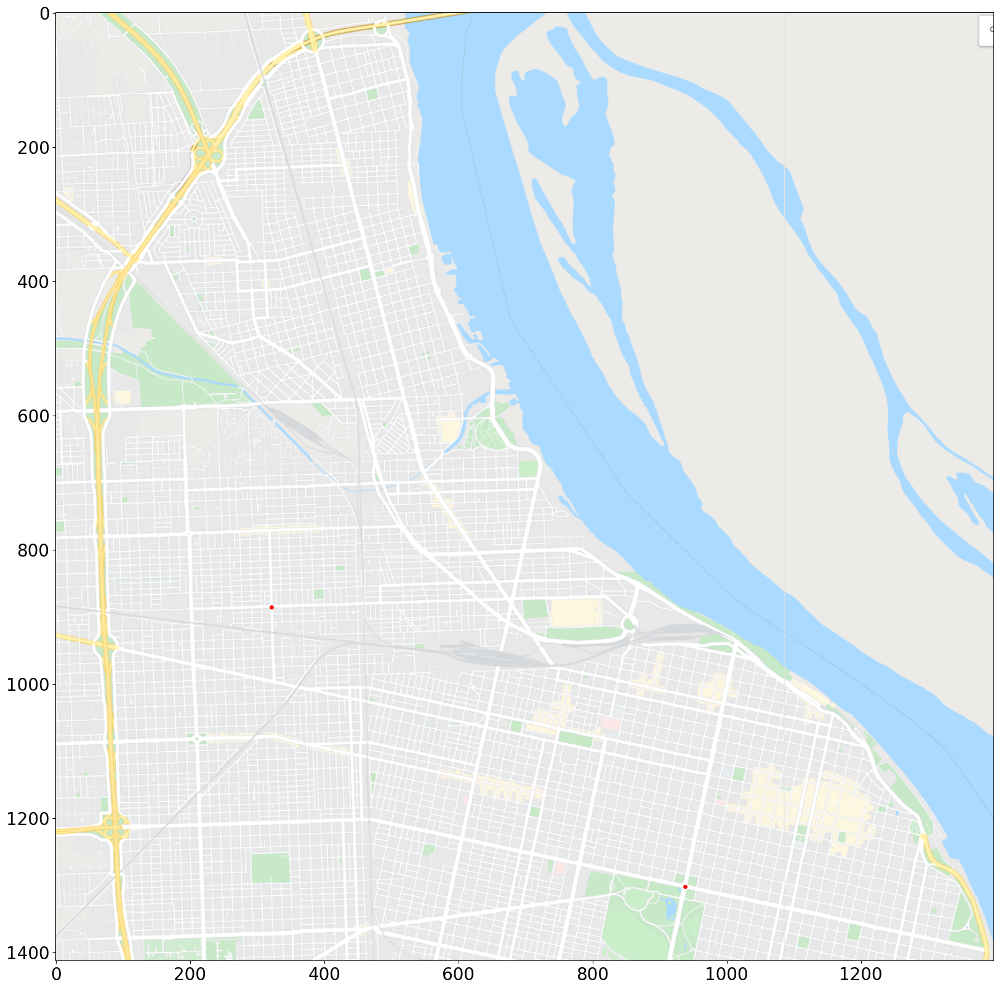

In [12]:
# Test con nuevos datos
# 1: Oroño y Pellegrini
# 2: Solis y Junin
work_map.plot([[ -32.95459 , -60.65599], [ -32.92738 , -60.70398]])

## Trayectoria

Cargaremos datos recopilados por los sensores y GPS de un celular. El celular fue ubicado en forma horizontal dentro de un auto mientras este realizaba la trayectoria por Rosario.

In [23]:
route_1_path = "data/processed/SensorTracker_20211011_175124.csv"
route_1 = pd.read_csv(route_1_path, sep=";")

In [24]:
route_1.head()

,Timestamp,Accel_x,Accel_y,Accel_z,Gyro_x,Gyro_y,Gyro_z,Light,Magnetic_x,Magnetic_y,Magnetic_z,Proximity,Latitude,Longitude,Elevation,Speed
0,20211011_175802.0,-0.348,-1.021,9.815,-0.003,-0.013,0.004,410.5,-47.831,18.263,-58.669,5.0,-32.95812,-60.63654,52.8,29.1
1,20211011_175802.5,-0.255,-0.762,9.657,0.005,0.007,0.005,410.5,-48.394,17.963,-57.263,5.0,-32.95813,-60.63644,53.6,30.1
2,20211011_175803.0,0.049,-0.755,10.256,-0.005,0.028,-0.001,410.5,-48.469,15.900,-60.525,5.0,-32.95813,-60.63644,53.6,30.1
3,20211011_175803.5,-0.111,-1.522,10.292,-0.027,0.020,0.007,410.5,-48.975,18.281,-59.419,5.0,-32.95815,-60.63635,51.9,30.1
4,20211011_175804.0,-0.499,-1.013,9.925,-0.023,-0.014,-0.005,410.5,-48.975,18.281,-59.419,5.0,-32.95815,-60.63635,51.9,30.1


Se observa que los datos necesitan tratamiento previo:

- El datetime debe ser corregido a un formato estándar. Se eligió utilizar timestamp de unix en milisegundos.

- Dado que algunos sensores se actualizan realmente a 1 segundo en lugar de 500 ms, se remuestrean los datos a 1 segundo.

- La velocidad se encuentra en km/h, es preferible transformarla a m/s

- Por la posición del celular, la aceleración del vehículo coincide con el eje Y.

In [25]:
# Correct timestamp
route_1['Timestamp'] = route_1['Timestamp'].map(lambda x: datetime.datetime.\
                                                            strptime(x, "%Y%m%d_%H%M%S.%f").timestamp(), \
                                                na_action='ignore')
# Resample to 1s
route_1 = route_1.loc[route_1['Timestamp']%1==0]

# Speed to m/s
route_1['Speed'] = route_1['Speed'].map(lambda x: x/3.6)

# Rename column
route_1['Acceleration'] = route_1['Accel_y']

# Reset Index
route_1 = route_1.reset_index(drop=True)

**Nota**: En los datos cargados falta el angulo de movimiento respecto al norte. Este valor se debería poder obtener a partir del acelerómetro, giróscopo y sensor magnético, pero requieren de una calibración previa. Dado que esta calibración no fue realizada, que los sensores del celular utilizado son de baja calidad y que la ecuaciones involucradas son complejas, se utilizó un modelo de redes neuronales LSTM para obtener el angulo respecto al norte a partir de los demas sensores. Este modelo fue entrenado con datos de otros recorridos.

**Nota 2**: La idea inicial sería no utilizar las mediciones de velocidad ya que no existe hoy en el mercado un medidor de velocidad compacto y barato (a menos que se agregue un encoder a alguna de las partes rotante del vehículo, lo cual involucra una instalación tediosa). Aún así, se decide utilizarlas para tener un primer abordaje del problema.

In [118]:
timestep = 5
model_input=np.zeros(shape=(route_1.shape[0],timestep,9))
for i in range(route_1.shape[0]):
    if i<timestep:
        for j in range(0,timestep-(i+1)):
            model_input[i,j,:]=np.array(route_1[['Accel_x','Accel_y','Accel_z','Gyro_x',
                                                'Gyro_y','Gyro_z','Magnetic_x','Magnetic_y','Magnetic_z']].iloc[0])
        for j in range(timestep-(i+1),timestep):
            model_input[i,j,:]=np.array(route_1[['Accel_x','Accel_y','Accel_z','Gyro_x',
                                                'Gyro_y','Gyro_z','Magnetic_x','Magnetic_y','Magnetic_z']].iloc[j-(timestep-(i+1))])
            
    else:
        for j in range(0,timestep):
            model_input[i,j,:]=np.array(route_1[['Accel_x','Accel_y','Accel_z','Gyro_x',
                                                'Gyro_y','Gyro_z','Magnetic_x','Magnetic_y','Magnetic_z']].iloc[i-timestep+j+1])

In [121]:
with open('bearing_model/bearing_model_config.json') as json_file:
    bearing_model = tf.keras.models.model_from_json(json_file.read())
bearing_model.load_weights('bearing_model/bearing_model.h5')

In [122]:
bearing_model.predict(model_input)

array([[ 86.32366 ],
       [ 61.604633],
       [ 30.706583],
       ...,
       [135.70308 ],
       [122.70732 ],
       [101.03117 ]], dtype=float32)

In [26]:
def get_bearing(lat1, long1, lat2, long2):
    dLon = (long2 - long1)
    x = math.cos(math.radians(lat2)) * math.sin(math.radians(dLon))
    y = math.cos(math.radians(lat1)) * math.sin(math.radians(lat2)) - math.sin(math.radians(lat1)) * math.cos(math.radians(lat2)) * math.cos(math.radians(dLon))
    brng = np.arctan2(x,y)
    brng = np.degrees(brng)

    return brng

In [27]:
route_1['Bearing'] = route_1['Timestamp'].map(lambda x:0)

for i in range(route_1.shape[0]-1):
    route_1['Bearing'].iloc[i] = get_bearing( route_1['Latitude'].iloc[i],
                                             route_1['Longitude'].iloc[i],
                                             route_1['Latitude'].iloc[i+1],
                                             route_1['Longitude'].iloc[i+1]
                                           )
route_1['Bearing'].iloc[-1] =  route_1['Bearing'].iloc[-2]

C:\Users\MaxiT\.conda\envs\GPU\lib\site-packages\pandas\core\indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


In [28]:
route_1.head()

,Timestamp,Accel_x,Accel_y,Accel_z,Gyro_x,Gyro_y,Gyro_z,Light,Magnetic_x,Magnetic_y,Magnetic_z,Proximity,Latitude,Longitude,Elevation,Speed,Acceleration,Bearing
0,1.633986e+09,-0.348,-1.021,9.815,-0.003,-0.013,0.004,410.5,-47.831,18.263,-58.669,5.0,-32.95812,-60.63654,52.8,8.083333,-1.021,96.796469
1,1.633986e+09,0.049,-0.755,10.256,-0.005,0.028,-0.001,410.5,-48.469,15.900,-60.525,5.0,-32.95813,-60.63644,53.6,8.361111,-0.755,104.833901
2,1.633986e+09,-0.499,-1.013,9.925,-0.023,-0.014,-0.005,410.5,-48.975,18.281,-59.419,5.0,-32.95815,-60.63635,51.9,8.361111,-1.013,98.473331
3,1.633986e+09,-0.447,-0.975,10.309,-0.008,-0.013,0.019,372.5,-48.788,16.856,-58.800,5.0,-32.95816,-60.63627,51.2,8.111111,-0.975,104.833906
4,1.633986e+09,-0.504,-0.999,9.621,-0.008,-0.003,0.012,372.5,-50.456,19.406,-60.488,5.0,-32.95818,-60.63618,50.6,7.750000,-0.999,98.473334


--------------------------------------------------------------------------------------------------------------------------------

# Punto 1

En este punto, supondremos que conocemos la posición inicial del vehículo y queremos realizar la predicción de las posiciones futuras del mismo.

En primer lugar crearemos la clase auto que encapsula lo referido a movimiento, ruido, sensado, etc.

Para el movimiento se decidió optar, luego de realizar varias pruebas con diferentes métodos, por un movimiento rectilíneo uniforme en la dirección de bearing.

Para el punto 1 también se supondrá que no hay error ni en la medición ni en el movimiento

In [37]:
class my_car():
    
    def __init__(self):
        self.lat = 0.0
        self.lon = 0.0
        self.movement_noise = 0
        self.speed_noise = 0
        self.bearing_noise = 0
        self.x = np.array([[0.], [0.], [0.]]) # State variables [Delta Distance, Speed, Bearing]

        
    def set_values(self, new_lat, new_lon, new_speed, new_bearing):
        self.lat = float(new_lat)
        self.lon = float(new_lon)
        self.position_noise(self.movement_noise)
        self.speed = np.random.normal(new_speed, self.speed_noise, 1)
        self.bearing = np.random.normal(new_bearing, self.bearing_noise, 1)
        
    
    def set_noise(self, new_movement_noise, new_speed_noise, new_bearing_noise):
        self.movement_noise = float(new_movement_noise)
        self.speed_noise = float(new_speed_noise)
        self.bearing_noise = float(new_bearing_noise)
        
        
    def position_noise(self,meters):
        dist=np.random.random()*meters
        angle=np.random.random()*360-180
        self.lat, self.lon = my_map.destinationPoint(self.lat, self.lon, dist, angle)
        
    
    def move(self, measurement, timestep):
        self.update(timestep)
        self.sense(measurement)
        
        
    def predict(self,measurement, timestep):
        self.sense(measurement)
        self.update(timestep)
    
    
    def update(self,timestep):
         # Make Movement
        self.x[0] = self.x[1]  * timestep
        self.lat, self.lon = my_map.destinationPoint(self.lat, self.lon, self.x[0], self.x[2])
        # Apply noise to the movement
        self.position_noise(self.movement_noise)
        
    
    def sense(self,measurement):
        measurement[0] = np.random.normal(measurement[0], self.speed_noise, 1)
        measurement[1] = np.random.normal(measurement[1], self.bearing_noise, 1)
        self.x[2] = measurement[1]
        self.x[1] = measurement[0]

**A modo de referencia, graficamos la ruta real y la comparamos contra la predicción del modelo planteado**

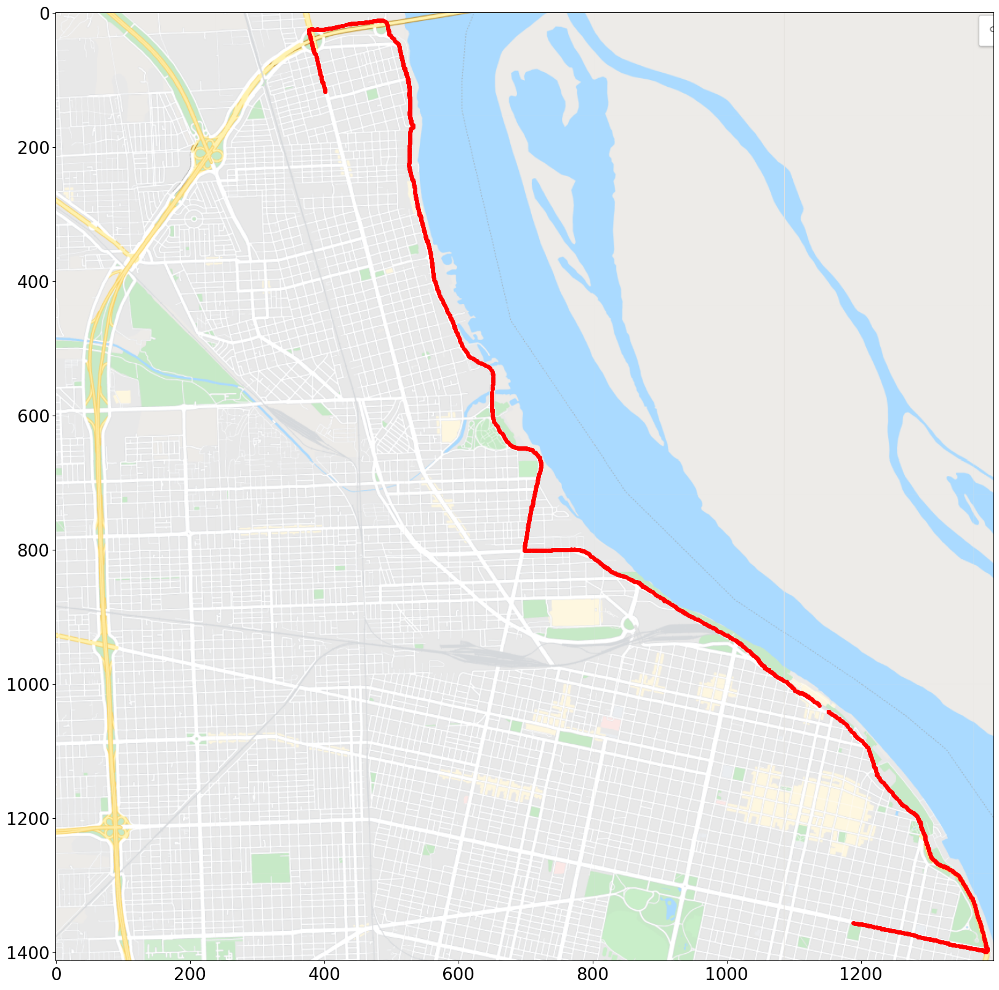

In [43]:
work_map.plot(np.array(route_1[['Latitude','Longitude']]))

In [46]:
ford_fiesta = my_car()
ford_fiesta.set_noise(0,0,0)
ford_fiesta.set_values(route_1['Latitude'].iloc[0], 
                       route_1['Longitude'].iloc[0],
                       0,
                       0)

In [47]:
lat_append=[]
lon_append=[]

for i in range (0,route_1.shape[0]-1):
    measurements = np.array([[route_1['Speed'].iloc[i]], [route_1['Bearing'].iloc[i]]])
    ford_fiesta.predict(measurements,1)
    lat_append.append(ford_fiesta.lat)
    lon_append.append(ford_fiesta.lon)

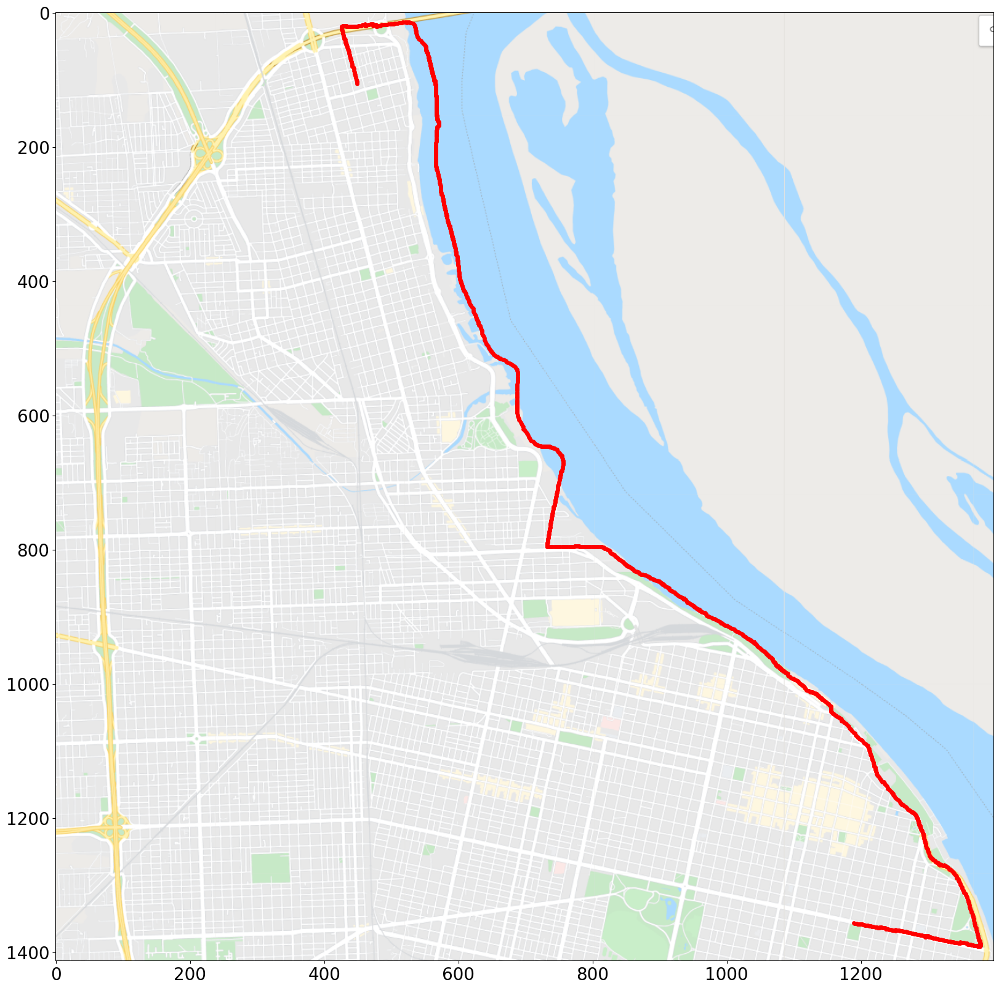

In [48]:
work_map.plot([(lat_append[i],lon_append[i]) for i in range(len(lat_append))])

**Se observa que ya de por si la predicción no es muy buena. Esto se debe primero a que la hipótesis de que las mediciones no poseen ruido es incorrecta ya que, si bien no se le agregó ruido artificialmente, al ser valores reales ya poseen ruido de medición de los sensores (muy alto de hecho). En segundo lugar, el modelo de movimiento rectilíneo es bastante simple, por lo que se pierde precisión al realizar esta hipótesis.**

A continuación, se grafica el error de predicción en metros para tener una idea cuantitativa

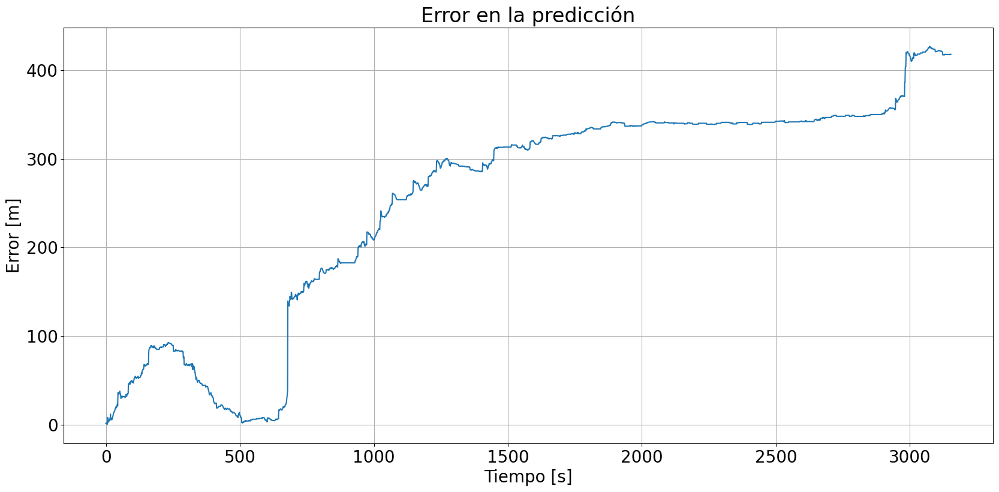

In [51]:
error = []
for i in range(len(lat_append)):
    error.append(my_map.haversine(lat_append[i],
                                  lon_append[i],
                                  route_1['Latitude'].iloc[i+1],
                                  route_1['Longitude'].iloc[i+1],)) # Estamos realizando una predicción 1s a futuro
plt.figure()
plt.plot(error)
plt.title("Error en la predicción")
plt.xlabel("Tiempo [s]")
plt.ylabel("Error [m]")
plt.show()

**A fin de mejorar los resultados obtenidos, se aplica un filtro de partículas con refinamiento según la máscara de probabilidades cargadas para el mapa de Rosario.**

In [75]:
class ParticleFilter():
    
    def __init__(self, work_map, initial_values, J, particles_noise=10):
        self.J = J
        self.particles_number = []
        self.center_lat = []
        self.center_lon = []
        self.radius_estimate = []
        self.work_map = work_map
        self.particles_noise = particles_noise
        
        self.particles=[]
        for i in range(J):
            ford_fiesta = my_car()
            ford_fiesta.set_noise(0,0,0)
            ford_fiesta.set_values(initial_values['Latitude'] ,
                                   initial_values['Longitude'], 
                                   0,
                                   0)
            ford_fiesta.position_noise(self.particles_noise)
            self.particles.append(ford_fiesta)
            
            
    def run(self, measurements, timestep):
        for step,measurement in measurements.iterrows():
            if ((step%timestep)==0):            
                sensors_measurement = np.array([[measurement['Speed']], [measurement['Bearing']]])
                wt = np.zeros(len(self.particles))
    
                for i in range(len(self.particles)):
                    self.particles[i].predict(sensors_measurement,timestep)
                    coord = [[self.particles[i].lat, self.particles[i].lon]]
                    wt[i] =self.work_map.get_policy_prob(coord)[0]     # Calculo de probabilidad de partículas
        
                new_particles = [self.particles[idx[0]] for idx in np.argwhere(wt>0)] #delete imposible positions
                self.particles = new_particles
                wt = wt[wt>0]
            
                self.particles_number.append(len(self.particles))
                
                #Append center and radius
                temp_center_lat=0
                temp_center_lon=0
                for i in range(len(self.particles)):
                    temp_center_lat += (self.particles[i].lat/len(self.particles))
                    temp_center_lon += (self.particles[i].lon/len(self.particles))
                self.center_lat.append(temp_center_lat)
                self.center_lon.append(temp_center_lon)

                max_temp_radius = 0
                for i in range(len(self.particles)):
                    temp_radius=my_map.haversine(temp_center_lat,temp_center_lon,self.particles[i].lat,self.particles[i].lon)
                    max_tem_radius = max(max_temp_radius, temp_radius)
                self.radius_estimate.append(max_tem_radius)

                self.particles = ParticleFilter.resampling_wheel(self.particles,wt, self.J, self.particles_noise)
                self.particles_number.append(len(self.particles))

        
    @staticmethod
    def resampling_wheel(list_particles, weights, J, particles_noise):
        new_list_particles = []
        wheel = np.cumsum(weights) / np.sum(weights)
        for i in range(J):
            rand_value = np.random.random()
            index = np.argmax(wheel>rand_value)
            new_list_particles.append(copy.deepcopy(list_particles[index]))
            # El resampling agrega ruido en la posición de las particulas para aumentar la probabilidad 
            # de tener partículas correctas
            new_list_particles[-1].position_noise(particles_noise)
        return new_list_particles

In [56]:
myParticleFilter = ParticleFilter(work_map, route_1.iloc[0], 1000)
myParticleFilter.run(route_1,1)

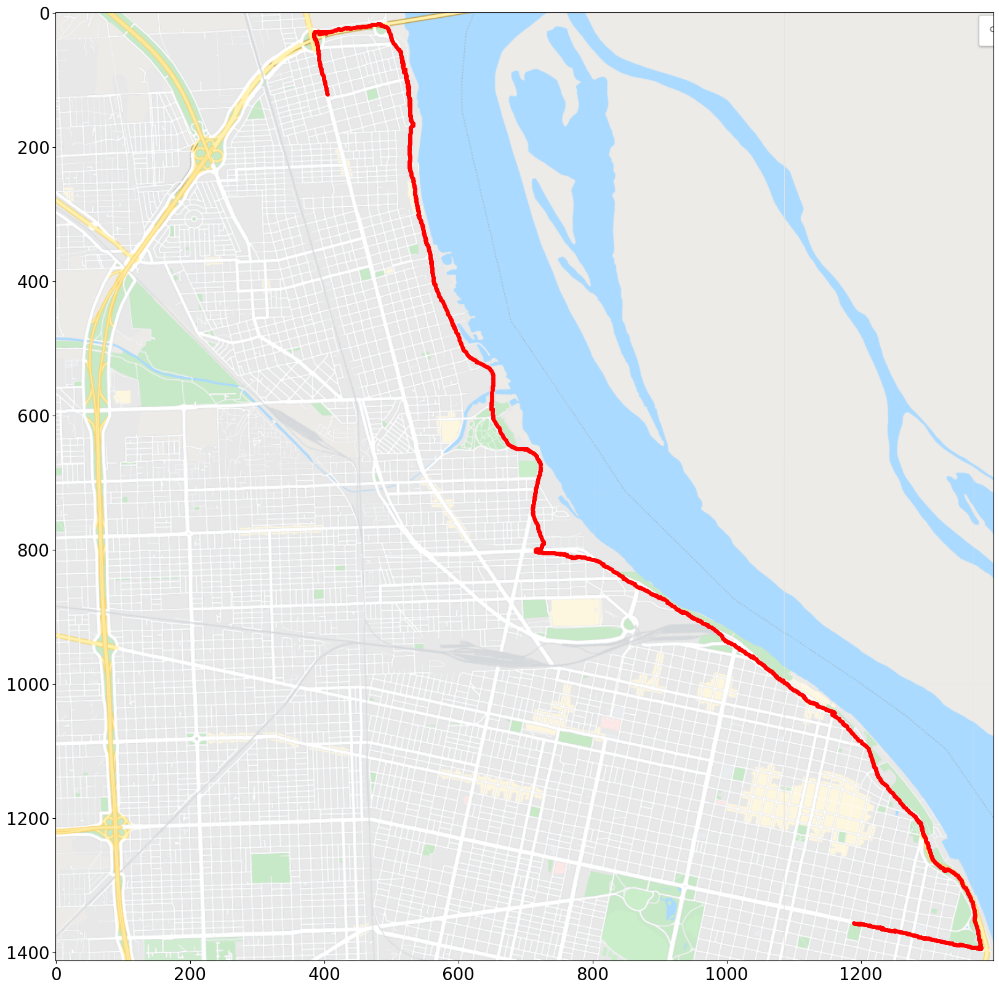

In [58]:
work_map.plot([(myParticleFilter.center_lat[i],myParticleFilter.center_lon[i]) for i in 
               range(len(myParticleFilter.center_lat))])

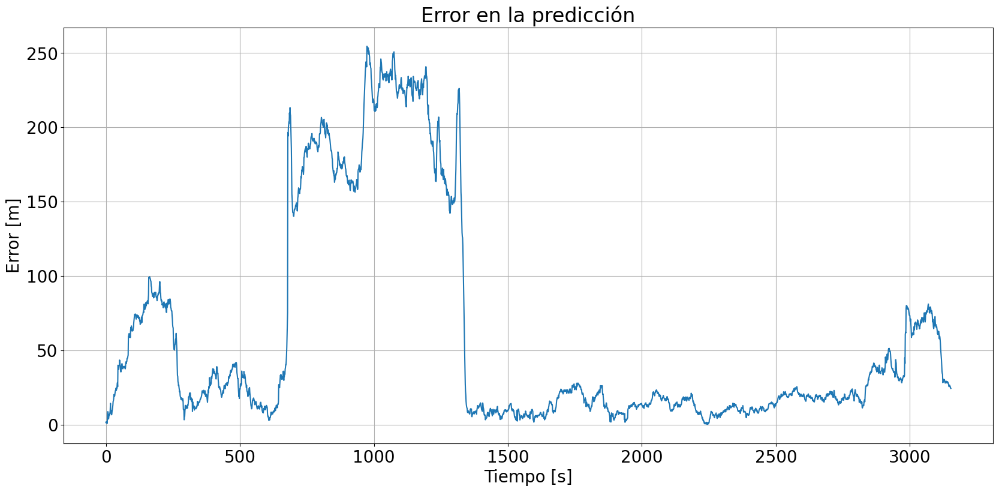

In [59]:
error = []
for i in range(len(lat_append)):
    error.append(my_map.haversine(myParticleFilter.center_lat[i],
                                  myParticleFilter.center_lon[i],
                                  route_1['Latitude'].iloc[i+1],
                                  route_1['Longitude'].iloc[i+1],)) # Estamos realizando una predicción 1s a futuro
plt.figure()
plt.plot(error)
plt.title("Error en la predicción")
plt.xlabel("Tiempo [s]")
plt.ylabel("Error [m]")
plt.show()

**Notamos que el modelo funciona perfecto, con un error de posición muy bajo.**

Probemos si una predicción a 10 segundos sigue funcionando correctamente

In [76]:
myParticleFilter = ParticleFilter(work_map, route_1.iloc[0], 1000, 50)
myParticleFilter.run(route_1,10)

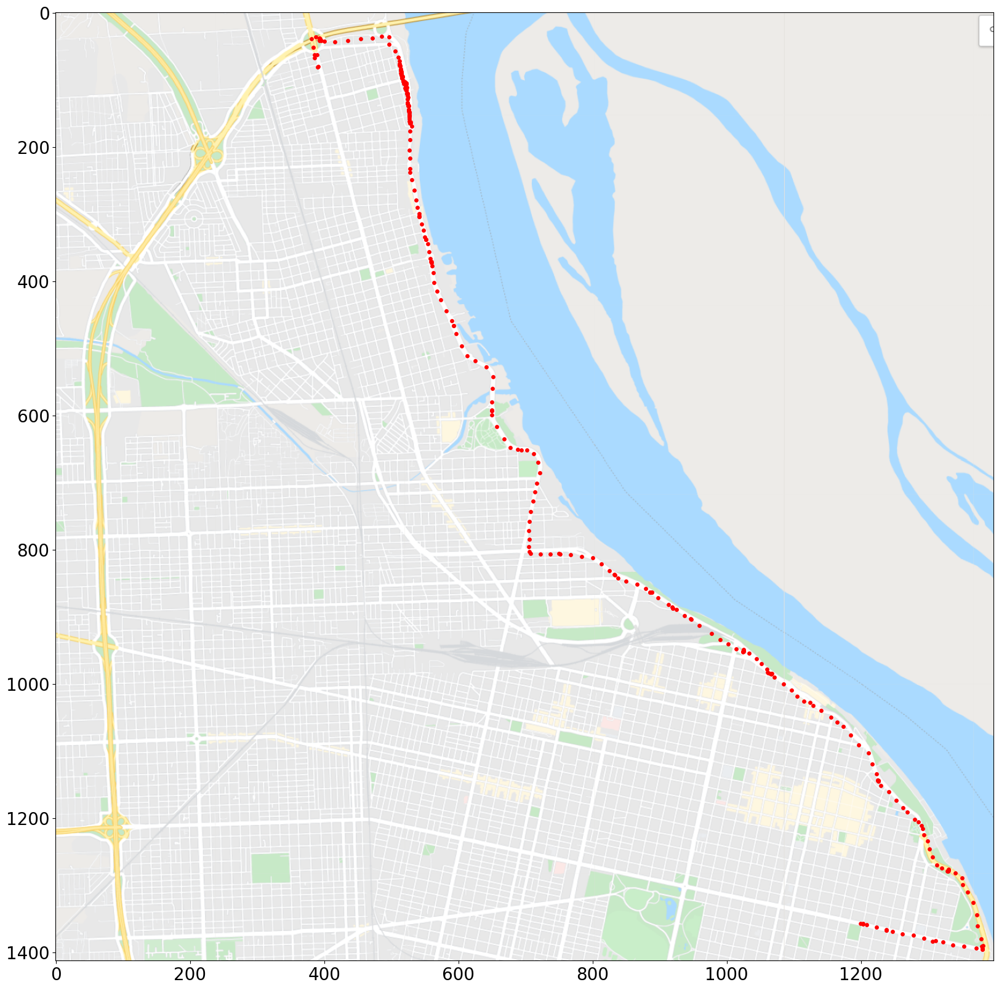

In [77]:
work_map.plot([(myParticleFilter.center_lat[i],myParticleFilter.center_lon[i]) for i in 
               range(len(myParticleFilter.center_lat)-1)])

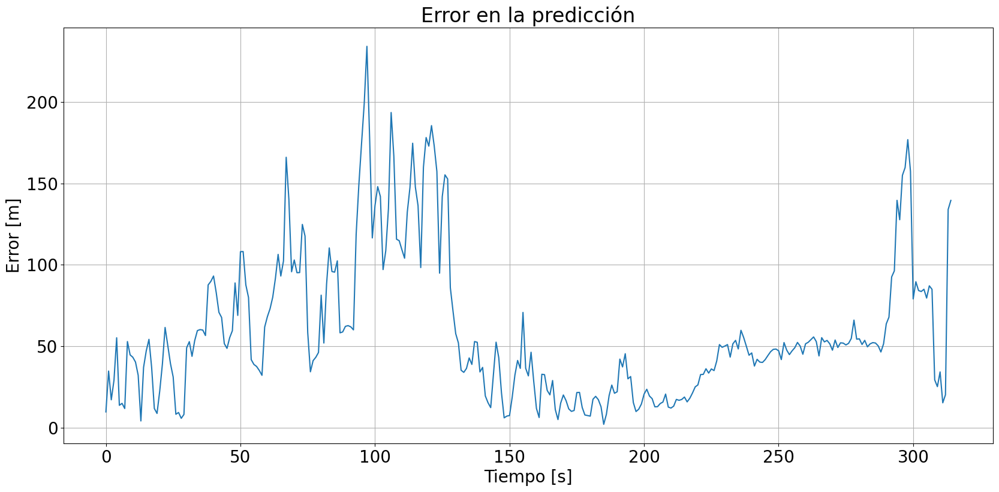

In [83]:
error = []
for i in range(len(myParticleFilter.center_lat)-1):
    error.append(my_map.haversine(myParticleFilter.center_lat[i],
                                  myParticleFilter.center_lon[i],
                                  route_1['Latitude'].iloc[(i+1)*10],
                                  route_1['Longitude'].iloc[(i+1)*10],)) # Estamos realizando una predicción 10s a futuro
plt.figure()
plt.plot(error)
plt.title("Error en la predicción")
plt.xlabel("Tiempo [s]")
plt.ylabel("Error [m]")
plt.show()

**Notamos que el modelo aún continúa funcionando muy bien**

--------------------------------------------------------------------------------------------------------------------------------

# Punto 2

En este punto, se complejizará en gran medida el problema. Supondremos ahora que la posición inicial es desconocida.
Al ser la posición desconocida, deberemos suponer que el auto puede estar en cualquier posición probable según la máscara de probabilidades del mapa de Rosario.

El modelo ahora será mucho mas lento ya que debe mover particulas por toda la ciudad y luego ir refinando. Se espera que luego de cierta cantidad de pasos, las mediciones determinen una única trayectoria posible.

In [ ]:
class Horus():
    
    def __init__(self, work_map, initial_values, path_to_initial_particles=None, J=1000, particles_noise=10):
        self.J = J
        self.center_lat = []
        self.center_lon = []
        self.radius_estimate = []
        self.work_map = work_map
        self.particles_noise = particles_noise
        
        if path_to_initial_particles is not None:
            self.load_particles(path_to_initial_particles)
        else:
            self.particles=[]
            for i in range(work_map.policy.shape[0]):
                for j in range(work_map.policy.shape[1]):
                    coord = work_map.to_coord([[i,j]])
                    if(work_map.get_policy_prob((coord))>0.5):
                        ford_fiesta = my_car()
                        ford_fiesta.set_noise(0,0,0)
                        ford_fiesta.set_values(coord[0][0], 
                                               coord[0][1],
                                               0,
                                               0)
                        self.particles.append(ford_fiesta)
                        
                        
    def save_particles(self, path):
        with open(path, 'wb') as fp:
            pkl.dump(self.particles, fp)
            
            
    def load_particles(self, path):
        with open(path, 'rb') as fp:
            self.particles = pkl.load(fp)
            
            
    def run(self, measurements, timestep, path_save=None, step_save=None):
        for step,measurement in measurements.iterrows():
            if ((step%timestep)==0):
                sensors_measurement = np.array([[measurement['Speed']], [measurement['Bearing']]])

                wt = np.zeros(len(self.particles))

                for i in range(len(self.particles)):
                    self.particles[i].predict(sensors_measurement,timestep)
                    coord = [[self.particles[i].lat, self.particles[i].lon]]
                    wt[i] =self.work_map.get_policy_prob(coord)[0]     

                new_particles = [self.particles[idx[0]] for idx in np.argwhere(wt>0)]
                self.particles = new_particles
                wt = wt[wt>0]

                #Append center and radius
                temp_center_lat=0
                temp_center_lon=0
                for i in range(len(self.particles)):
                    temp_center_lat += (self.particles[i].lat/len(self.particles))
                    temp_center_lon += (self.particles[i].lon/len(self.particles))
                self.center_lat.append(temp_center_lat)
                self.center_lon.append(temp_center_lon)

                max_temp_radius = 0
                for i in range(len(self.particles)):
                    temp_radius=my_map.haversine(temp_center_lat,temp_center_lon,self.particles[i].lat,self.particles[i].lon)
                    max_tem_radius = max(max_temp_radius, temp_radius)
                self.radius_estimate.append(max_tem_radius)

                if path_save is not None:
                    if ((step%step_save) == 0):
                        self.save_particles(path_save+'particles_'+str(step)+'.pkl')

                if(round(np.sum(wt))<self.J):
                    self.particles = Horus.resampling_wheel(self.particles,wt, self.J,self.particles_noise)
            
            
    def plot(self, points=10000, save_path=None):
        points = min(points,len(self.particles))
        idx = np.random.randint(0, len(self.particles), points)
        if save_path is not None:
            self.work_map.plot(np.array([[self.particles[i].lat,self.particles[i].lon] for i in idx]), save_path)
        else:
            self.work_map.plot(np.array([[self.particles[i].lat,self.particles[i].lon] for i in idx]))
        
        
    @staticmethod
    def resampling_wheel(list_particles, weights, J, particles_noise):
        new_list_particles = []
        wheel = np.cumsum(weights) / np.sum(weights)
        for i in range(J):
            rand_value = np.random.random()
            index = np.argmax(wheel>rand_value)
            new_list_particles.append(copy.deepcopy(list_particles[index]))
            new_list_particles[-1].position_noise(particles_noise)
        return new_list_particles

## Prediccion a 1 segundo

In [110]:
particle_model = Horus(work_map, route_1.iloc[0], 'parte2/route1/particles_saves/init_particles.pkl', J=5000)
#particle_model = Horus(work_map, route_1.iloc[0]) #create initial particles
#particle_model.save_particles('parte2/route1/particles_saves/init_particles.pkl')

In [111]:
particle_model.run(route_1, 1, path_save='parte2/route1/particles_saves/', step_save=20)

In [112]:
with open('parte2/route1/horus_saves/horus_1.pkl', 'wb') as fp:
    pkl.dump(particle_model, fp)

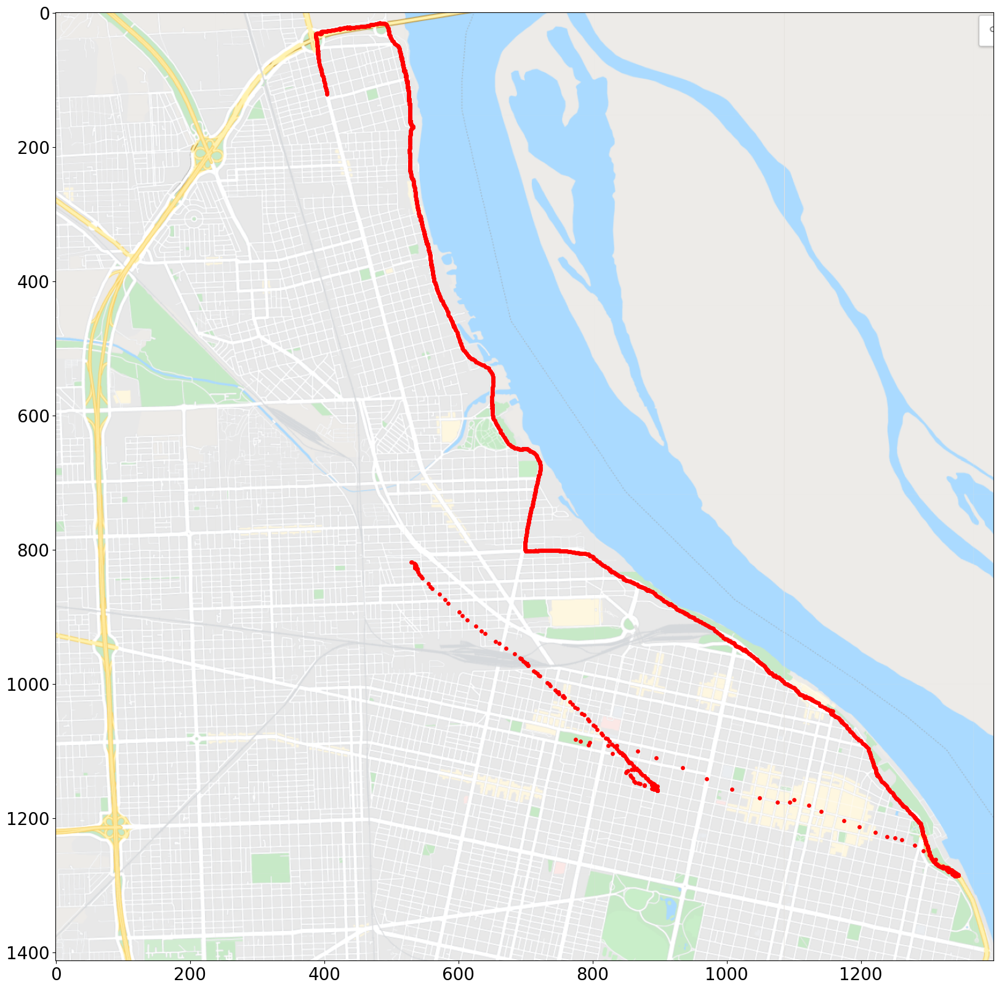

In [113]:
work_map.plot([(particle_model.center_lat[i],particle_model.center_lon[i]) for i in 
               range(len(particle_model.center_lat))])

**Observamos que el modelo encuentra correctamente la posición desconocida del auto y luego la trackea correctamente.**

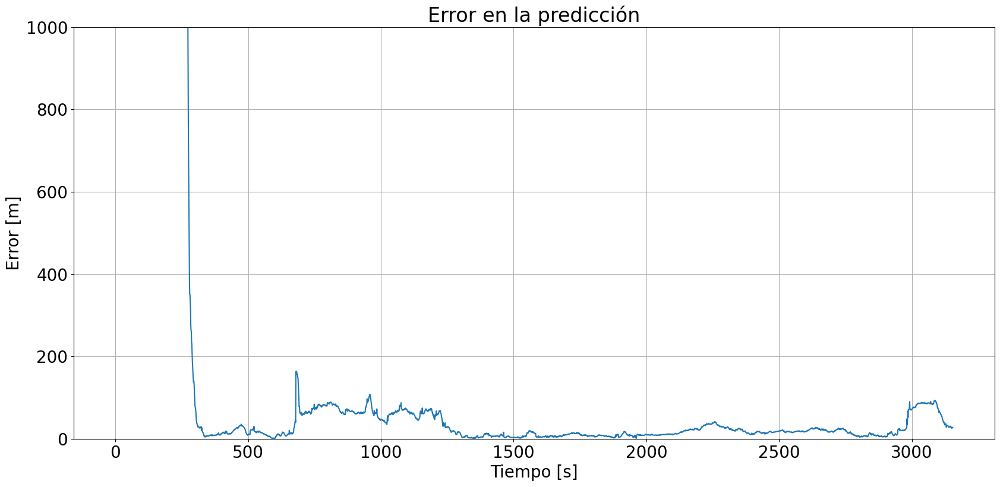

In [115]:
error = []
for i in range(len(particle_model.center_lat)):
    error.append(my_map.haversine(particle_model.center_lat[i],
                                  particle_model.center_lon[i],
                                  route_1['Latitude'].iloc[i],
                                  route_1['Longitude'].iloc[i],)) # Estamos realizando una predicción 10s a futuro
plt.figure()
plt.plot(error)
plt.title("Error en la predicción")
plt.xlabel("Tiempo [s]")
plt.ylabel("Error [m]")
plt.ylim([0, 1000])
plt.show()

Grabaremos la foto de todas las particulas en los pasos intermedios para poder ver la evolución del filtro

## Prediccion a 10 segundos

In [97]:
particle_model = Horus(work_map, route_1.iloc[0], 'parte2/route1_10s/particles_saves/init_particles.pkl',particles_noise=50)
#particle_model = Horus(work_map, route_1.iloc[0]) #create initial particles
#particle_model.save_particles('parte2/route1_10s/particles_saves/init_particles.pkl')

In [98]:
particle_model.run(route_1, 10, path_save='parte2/route1_10s/particles_saves/', step_save=20)

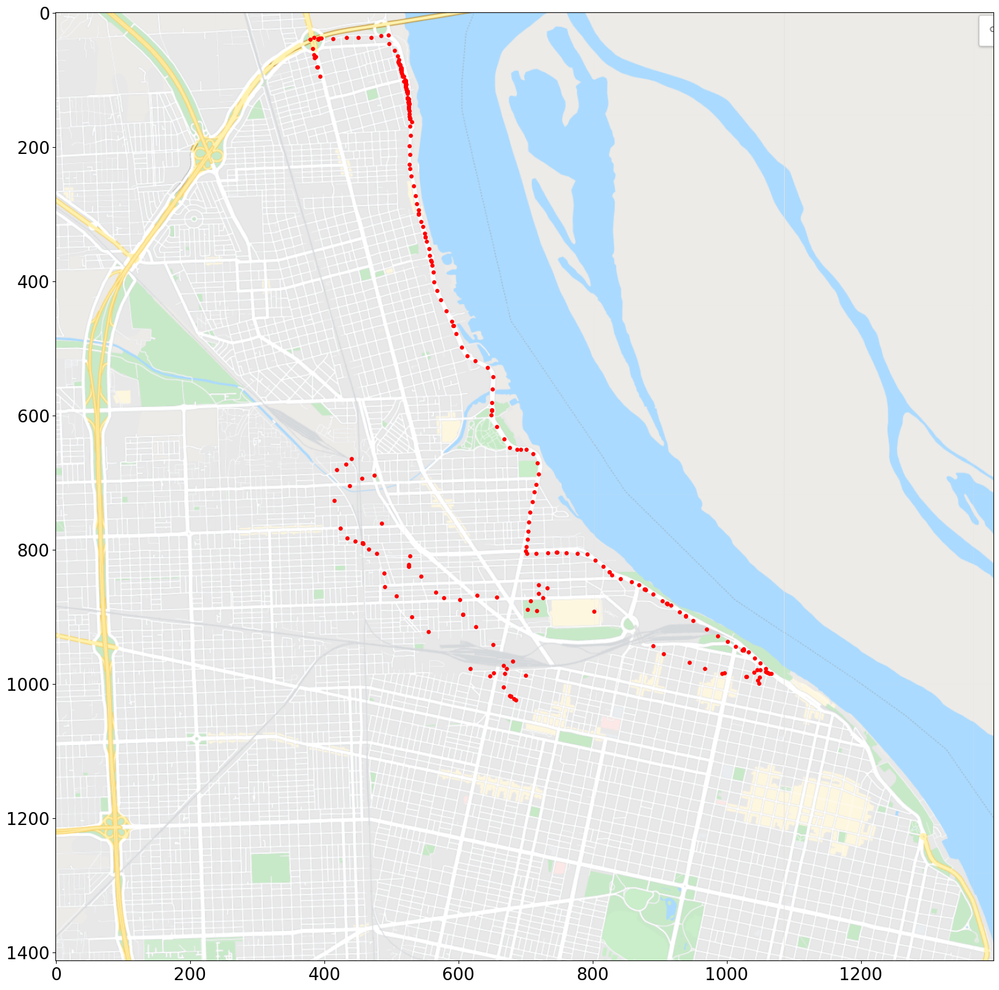

In [101]:
work_map.plot([(particle_model.center_lat[i],particle_model.center_lon[i]) for i in 
               range(len(particle_model.center_lat))])

**Observamos que el modelo funciona correctamente aún con una predicción a 10 segundos. No obstante, en este caso demoró varios steps más para converger**

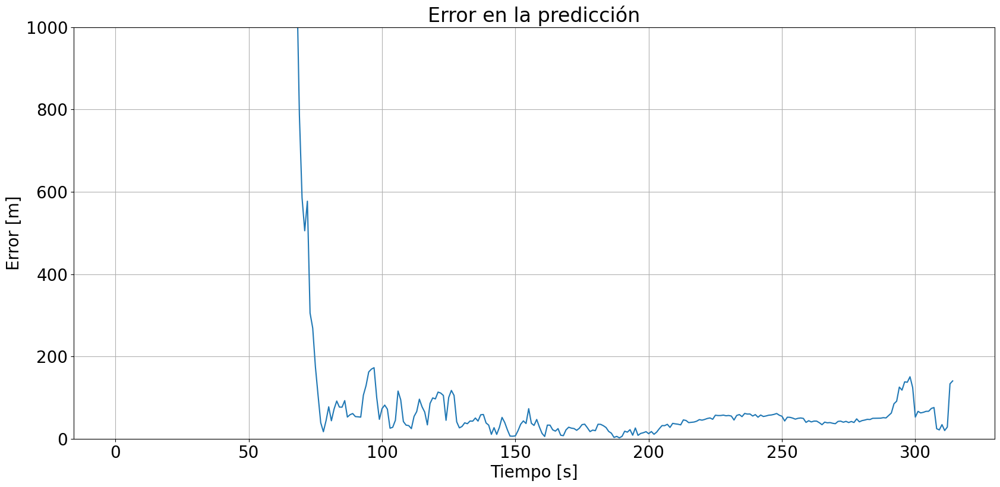

In [105]:
error = []
for i in range(len(particle_model.center_lat)-1):
    error.append(my_map.haversine(particle_model.center_lat[i],
                                  particle_model.center_lon[i],
                                  route_1['Latitude'].iloc[(i+1)*10],
                                  route_1['Longitude'].iloc[(i+1)*10],)) # Estamos realizando una predicción 10s a futuro
plt.figure()
plt.plot(error)
plt.title("Error en la predicción")
plt.xlabel("Tiempo [s]")
plt.ylabel("Error [m]")
plt.ylim([0, 1000])
plt.show()